# Analysis Vemco eel data 1st processing

In [ ]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')



## Post-processing of eel positioning files

The file *Positions/TRANSMITTER-XX-CALC-POSITIONS.csv* contains positioning data on individual eels. Following fields are present in the files:

- TRANSMITTER: Name of the transmitter (see section 1.2).
- DETECTEDID: Full ID for the transmission that was used to calculate the position.
- DATETIME: Transmission date/time, in YYYY-MM-DD HH:MM:SS format (**UTC-time!!!**)
- X, Y: Projected X and Y coordinates (Azimuthal equidistant projection), in metres.
- D: Depth used for calculating position (metres). This is either a depth sensor reading, or if one is not available, the Assumed Depth as specified in the VPS Specification spreadsheet.
- Lat, Lon: Geographic latitude and longitude coordinates (WGS84 datum), in decimal degree format.
- n: Number of receiver triangles used to calculate the final weighted position
- HPE: Horizontal Position Error estimate.
- HPEm: For sync and reference transmitters only. The Measured Horizontal Position Error is the horizontal distance, in metres, between the calculated position and the known location of the transitter (gps measurement).
- TEMP: Temperature sensor reading, if present, in degrees C
- DEPTH: Depth sensor reading, if present, in metres
- ACCEL: Accelerometer sensor reading, if present, in m/s2
- DRX: Space separated list of names of all stations with detecting receiver.
- URX: Space separated list of names of all stations with detecting receiver used in the calculation of the final position. The final position is the weighted average of positions calculated from groups of 3 receivers in this list.

For each file, following quantities are calculated, via the script: **calcIndFish.py**

- duration of stay
- DETINT: time between detections (in seconds)
- DISTANCE distance between detections (in meters)
- U: swimming velocity (in m/s)

Statistics (for all animals) needed from: 

- all the former
- depth
- nb of receivers used to calculate a position
- nb of animals passing which passage

**!!Recalculate statistics after determining treshold of reliable data!!**

Maps needed with:

- Positions (with time slider)
- quivers that indicate direction and velocity (in 3D)
- HPE according to location (idea: plot for each fish in one color, surface of the bullet is related to magnitude of HPE)

Threshold for filtering HPE is determined in R notebook [FilteringHPE](FilteringHPE.ipynb).   
HPE-cutoff = 4.



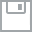
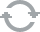
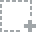
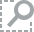
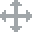
...
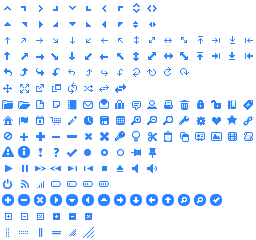
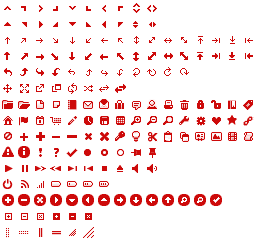
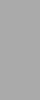
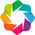
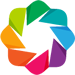

In [1]:
%matplotlib notebook 
import numpy as np
import pandas as pd 
import matplotlib as mpl 
import matplotlib.pyplot as plt
import datetime
from datetime import datetime
from datetime import timedelta
import math
import scipy as sc
from scipy import stats
from IPython.display import Image # to upload and show images

# for interactive bokeh figures
from ipywidgets import interact
from bokeh.models.widgets import Slider, Panel, Tabs
from bokeh.io import output_notebook, hplot, show, gridplot #, vform
from bokeh.plotting import figure
output_notebook()

import sys
sys.path.insert(0, "/Users/jennavergeynst/Documents/AllroundFunctions/")
#from calcIndFish import calcDisDetU #if you bring the function outside, use this to import

In [2]:
def distance(X,Y):
    """
    Function to calculate the distance between sequential points in a series. 
    The distance from the previous point is calculated, so the first element is NAN.
    X is the series of x-coordinates, Y is the series of Y-coordinates
    """
    X_1 = X.shift(1)
    Y_1 = Y.shift(1)
    dist = ((X-X_1)**2+(Y-Y_1)**2)**0.5
    return dist
    

In [3]:
def timeInterval (datetime):
    """
    Function to calculate the interval between sequential times in a series.
    """
    
    detInterval = np.zeros((datetime.shape[0]))
    for t in range (1,datetime.shape[0]):
        currentInt = (datetime[t] - datetime[t-1])
        detInterval[t] = currentInt.seconds
    detInterval[0] = 'NaN'
    return detInterval

In [4]:
def calcDisDetU (allData, shortID, cutoff):
    """
    Function used to calculate variables on individual fish (eel) positioning data.
    Input is the short ID of the transmitter ('shortID')
    csv file is read by script
    Output is 
    - dataframe with 3 extra columns: DISTANCE, DETINT, U
    - list of period that each eel was detected
    - list of duration of each eel's period
    """

    #allData = pd.read_csv("/Users/jennavergeynst/Documents/DataHam/VPS/VPS-INBO-01-Results20160304/Positions/ALL-CALC-POSITIONS.csv")
    #allData = pd.read_csv("ALL-CALC-POSITIONS-shadowFilter.csv") #reading file with extra column shadowFilter (still containing all data)
    tagData = allData[allData["TRANSMITTER"]==shortID].reset_index(drop=True)
    # read datetime column in datetime format
    tagData['DATETIME'] = pd.to_datetime(tagData['DATETIME'])
    tagData = tagData[tagData['HPE']<cutoff].reset_index(drop=True)
    
    #Calculate distance from last detection
    tagData['DISTANCE'] = distance(tagData['X'],tagData['Y'])
    
    #Calculate time since last detection
    tagData['DETINT'] = timeInterval(tagData['DATETIME'])

    #Calculate swim velocity since last detection
    tagData['U'] = tagData['DISTANCE'] / tagData['DETINT']
    
    #Calculate duration of stay
    length = len(tagData['DATETIME'])
    durStay = tagData['DATETIME'][length-1]-tagData['DATETIME'][0]
    
    #give first and last moment of detection
    period = [min(tagData['DATETIME']),max(tagData['DATETIME'])]
    
    tagData['U_Filter'] = np.ones(tagData.shape[0])


    return tagData, durStay, period
    

In [5]:
def U_filtering(data_tag):
    U_lim = 2 #m/s
    IDlist = np.concatenate([np.arange(100,110,1), [26514], np.arange(38725,38734,1), np.arange(38736,38739,1), [38740]],axis = 0)
    tD = {}
    
    # print(...) in for loop is for debugging
    for eelID in IDlist:#IDlist
        data_noNan = data_tag[eelID].dropna(how='all')
        tD_copy = data_noNan.loc[:,['DATETIME','X','Y']]#remove nans, but only if all row is nan
        #print(tD_copy.head())
        U_filter = np.ones((data_noNan.shape[0]))
        i = 1 #seperate index for tD_copy
        for t in range (1,data_noNan.shape[0]-1):
            distance = ((tD_copy['X'][i]-tD_copy['X'][i-1])**2+(tD_copy['Y'][i]-tD_copy['Y'][i-1])**2)**0.5
            timeDif = (tD_copy['DATETIME'][i] - tD_copy['DATETIME'][i-1]).seconds
            U = distance/timeDif
            if U > U_lim:
                #tagData[eelID]['U_Filter'][t] = 0
                U_filter[t] = 0
                tD_copy = tD_copy[tD_copy['DATETIME']!= tD_copy['DATETIME'][i]].reset_index(drop=True)
            else:
                i = i+1
        data_noNan.loc[:,'U_Filter']  = U_filter
        
        # remove and recalculate DISTANCE, DETINT and U
        #print(data_tag[eelID].columns)
        data_noNan = data_noNan.drop({'DISTANCE', 'DETINT', 'U'}, axis=1)
        #Recalculate distance from last detection
        # way around: distance function doesn't work for unknown reason...
        X = data_noNan['X']
        Y = data_noNan['Y']
        X_1 = X.shift(1)
        Y_1 = Y.shift(1)
        dist = ((X-X_1)**2+(Y-Y_1)**2)**0.5
        data_noNan.loc[:,'DISTANCE'] = dist
        data_noNan.loc[:,'DETINT'] = timeInterval(data_noNan['DATETIME'])
        data_noNan.loc[:,'U'] = data_noNan['DISTANCE']/data_noNan['DETINT']
        
        tD[eelID] = data_noNan
    
    filteredData = pd.concat(tD, axis=1)
    vertical = pd.concat(tD, axis=0)
    return filteredData, vertical

data_tag = tagData_F0
U_lim = 2 #m/s
IDlist = np.concatenate([np.arange(100,110,1), [26514], np.arange(38725,38734,1), np.arange(38736,38739,1), [38740]],axis = 0)

# print(...) in for loop is for debugging
for eelID in IDlist:#IDlist
    print(eelID)
    data_noNan = data_tag[eelID].dropna(how='all')
    tD_copy = data_noNan.loc[:,['DATETIME','X','Y']]#remove nans, but only if all row is nan
    #print(tD_copy.head())
    U_filter = np.ones((data_tag[eelID].shape[0]))
    i = 1 #seperate index for tD_copy
    for t in range (1,data_noNan.shape[0]-1):
            #print(t)
        #print(i)
        distance = ((tD_copy['X'][i]-tD_copy['X'][i-1])**2+(tD_copy['Y'][i]-tD_copy['Y'][i-1])**2)**0.5
        #print(tD_copy['DATETIME'][i] - tD_copy['DATETIME'][i-1])
        timeDif = (tD_copy['DATETIME'][i] - tD_copy['DATETIME'][i-1]).seconds
        U = distance/timeDif
        if U > U_lim:
            #tagData[eelID]['U_Filter'][t] = 0
            U_filter[t] = 0
            tD_copy = tD_copy[tD_copy['DATETIME']!= tD_copy['DATETIME'][i]].reset_index(drop=True)
        else:
            i = i+1
    data_tag.loc[:,(eelID,'U_Filter')]  = U_filter
        
        # remove and recalculate DISTANCE, DETINT and U
        #print(data_tag[eelID].columns)
    data_tag[eelID] = data_tag[eelID].drop({'DISTANCE', 'DETINT', 'U'}, axis=1)
        #print(data_tag[eelID]['Y'])
        #Recalculate distance from last detection
    X = data_noNan['X']
    Y = data_noNan['Y']
    X_1 = X.shift(1)
    Y_1 = Y.shift(1)
    dist = ((X-X_1)**2+(Y-Y_1)**2)**0.5
    data_noNan.loc[:,'DISTANCE'] = dist
    #print(max(data_noNan[eelID]['DATETIME']))
    data_noNan.loc[:,'DETINT'] = timeInterval(data_noNan['DATETIME'])
    data_tag.loc[:,(eelID,'U')] = data_tag[eelID]['DISTANCE']/data_tag[eelID]['DETINT']
        
# after loop: make new concatenated dataframe

In [6]:
# Make dataframe with extra variables for not-filtered data
cutoff = 100000# for now no cutoff

allData_F0 = pd.read_csv("ALL-CALC-POSITIONS-shadowFilter.csv")
# eel ID's: 100 to 109, 26514, 38725 to 38740 but 34, 35, 38 and 39 missing
# np.arange is halfopen interval!
IDlist = np.concatenate([np.arange(100,110,1), [26514], np.arange(38725,38734,1), np.arange(38736,38739,1), [38740]],axis = 0)
tD = {}
stayDurations_F0 = {}
periods_F0 = {}
#IDlist = IDlist.astype(str)
#initialise a dictionary, this can have strings as indices
for shortID in IDlist:
    tempTD, tempDS, tempPer = calcDisDetU(allData_F0, str(shortID), cutoff)
    tD[shortID] = tempTD
    stayDurations_F0[shortID] = tempDS
    periods_F0[shortID] = tempPer
    
#del tagData_F0
tagData_F0 = pd.concat(tD, axis=1)
vertical_F0 = pd.concat(tD, axis=0)
# make a dataframe with subdataframes per eel. Axis = 1 means: put columns next to each other

In [7]:
# Make dataframe with extra variables for shadow-filtered data
cutoff = 100000# for now no cutoff

allData_F1 = allData_F0[allData_F0['S_Filter']==1].reset_index(drop=True)
# eel ID's: 100 to 109, 26514, 38725 to 38740 but 34, 35, 38 and 39 missing
# np.arange is halfopen interval!
IDlist = np.concatenate([np.arange(100,110,1), [26514], np.arange(38725,38734,1), np.arange(38736,38739,1), [38740]],axis = 0)
tD = {}
stayDurations_F1 = {}
periods_F1 = {}
#IDlist = IDlist.astype(str)
#initialise a dictionary, this can have strings as indices
for shortID in IDlist:
    tempTD, tempDS, tempPer = calcDisDetU(allData_F1, str(shortID), cutoff)
    tD[shortID] = tempTD
    stayDurations_F1[shortID] = tempDS
    periods_F1[shortID] = tempPer
    
tagData_F1 = pd.concat(tD, axis=1)
vertical_F1 = pd.concat(tD, axis=0)
# make a dataframe with subdataframes per eel. Axis = 1 means: put columns next to each other

In [8]:
# 2nd filter: U filter on original data
(tagData_F2, vertical_F2) = U_filtering(tagData_F0)

In [9]:
# 3rd filter: U filter + shadowfilter
(tagData_F3, vertical_F3) = U_filtering(tagData_F1)

In [21]:
nb_F0 = vertical_F0.size # total nb of fish positions
nb_F1 = vertical_F1.size # nb of fish positions after shadow filtering
nb_F2 = vertical_F2[vertical_F2['U_Filter']==1].size # nb of fish positions after U filtering
nb_F3 = vertical_F3[vertical_F3['U_Filter']==1].size # nb of fish positions after U filtering + shadowfiltering


Percentage fish data loss through shadow filtering:

In [22]:
(nb_F0-nb_F1)/nb_F0*100

17.645470500877547

Percentage fish data loss through U filtering:

In [23]:
(nb_F0-nb_F2)/nb_F0*100

5.4002970163358981

Percentage fish data loss through U and shadow filtering:

In [24]:
(nb_F0-nb_F3)/nb_F0*100

20.669636830025652

**The period and length of the period that each eel was swimming in the detection range**

In [ ]:
periods_F0

In [ ]:
stayDurations_F0

**Comparison of distance between detections**

In [25]:
#tagData.loc[:, (slice(None), 'DISTANCE')].describe()
extract = list(range(100,110,1))+[26514]
tagData_F0.loc[:, (extract, 'DISTANCE')].describe()

,100,101,102,103,104,105,106,107,108,109,26514
,DISTANCE,DISTANCE,DISTANCE,DISTANCE,DISTANCE,DISTANCE,DISTANCE,DISTANCE,DISTANCE,DISTANCE,DISTANCE
count,1479.000000,146.000000,23.000000,968.000000,38.000000,321.000000,65.000000,118.000000,888.000000,94.000000,23.000000
mean,12.275949,40.156929,48.117206,47.271592,41.312593,41.683292,26.760178,45.283409,38.624887,51.436830,68.931562
std,31.007198,62.057775,49.580577,69.974857,74.584734,60.144190,47.126227,54.554639,64.158928,76.915918,70.120140
min,0.031623,0.828553,6.726321,1.142366,1.350333,0.010000,1.285496,2.657066,0.028284,3.444009,16.161043
25%,1.063344,13.670004,17.424947,12.047976,11.688481,5.500445,10.950525,15.535511,8.964216,11.892056,29.803505
50%,3.492005,18.554338,28.069423,17.466001,17.260996,15.192883,16.560930,22.545749,13.837587,16.951591,43.106143
75%,10.489273,41.258209,69.314565,42.227652,33.492700,64.782004,23.577769,45.652983,30.566940,46.335064,64.700874
max,353.709202,390.494830,237.154990,359.289092,342.056550,391.869790,374.491199,250.302238,389.828037,331.849206,268.867920


In [ ]:
extract = list(range(38725,38734,1))+list(range(38736,38739,1))+ [38740]
tagData_F0.loc[:, (extract, 'DISTANCE')].describe()

**Comparison of time between detections (time in seconds)**

In [ ]:
extract = list(range(100,110,1))+[26514]
tagData_F0.loc[:, (extract, 'DETINT')].describe()

In [ ]:
extract = list(range(38725,38734,1))+list(range(38736,38739,1))+ [38740]
tagData_F0.loc[:, (extract, 'DETINT')].describe()

**Comparison of swimvelocities**

In [ ]:
extract = list(range(100,110,1))+[26514]
tagData_F0.loc[:, (extract, 'U')].describe([.25, .5, .75, .90, .95, .99])

In [ ]:
extract = list(range(38725,38734,1))+list(range(38736,38739,1))+ [38740]
tagData_F0.loc[:, (extract, 'U')].describe()

**Statistics on all eels together**

In [35]:
vertical_F2.loc[:,('n','HPE','DISTANCE','DETINT','U')].describe()

,n,HPE,DISTANCE,DETINT,U
count,7407.000000,7407.000000,7383.000000,7383.000000,7383.000000
mean,5.722830,118.528676,35.105637,294.095625,0.687822
std,3.955566,1266.142640,59.307499,3015.593727,1.420244
min,1.000000,1.600000,0.010000,18.000000,0.000231
25%,2.000000,2.300000,6.210036,27.000000,0.125013
50%,5.000000,6.400000,13.479113,33.000000,0.346260
75%,8.000000,23.600000,31.151126,61.000000,0.561202
max,19.000000,66554.600000,401.058087,83716.000000,16.592460


**COMMENT** Eels cannot swim 16 m/s (57 km/h)! 

In [27]:
vertical_F0.loc[100:109,('DEPTH')].describe()

count    4150.000000
mean        3.495312
std         1.804940
min        -0.151600
25%         1.970800
50%         3.638400
75%         4.927000
max        14.402000
Name: DEPTH, dtype: float64

**COMMENT** Problem: minimal depth negative!

Visualisation

In [28]:
def showTracks(trackingData):
    """
    Function used to show for each eelID 4 graps:
    - swimming track on map
    - latitude vs time
    - longitude vs time
    - velocity vs time
    """
    walls = pd.read_csv("~/Documents/Analysis/QGis visualisaties/walls-nodes.csv")
    recArray = pd.read_csv("~/Documents/DataHam/VPS/VPS-INBO-01-Results20160304/onlyStationLocations.csv")
    latRange = (51.0955,51.0985)
    lonRange = (5.108, 5.116)
    tab = [0]*len(IDlist)
    i=0

    for eelID in IDlist:
        eelTrack = trackingData[eelID]
        timeRange = (min(eelTrack["DATETIME"]),max(eelTrack["DATETIME"]))
    
        p1 = figure(width=400, height=400, y_axis_label='latitude', x_axis_label='longitude',y_range =latRange, x_range = lonRange)
        p1.circle(eelTrack['LON'], eelTrack['LAT'], size = 4)
        p1.line(eelTrack['LON'], eelTrack['LAT'])
        p1.line(walls['Longitude'], walls['Latitude'], color = 'black', line_width = 3)
        p1.triangle(recArray['Longitude'], recArray['Latitude'], size = 4, color = 'red')

        p2 = figure(width=400, height=400, y_axis_label='latitude', x_axis_type="datetime", x_axis_label='time',x_range = timeRange, y_range =p1.y_range)
        p2.line(eelTrack['DATETIME'],eelTrack['LAT'])
    
        p3 = figure(width=400, height=400, x_axis_label='longitude', y_axis_type="datetime", y_axis_label='time',x_range =p1.x_range, y_range = p2.x_range)
        p3.line(eelTrack['LON'], eelTrack['DATETIME'])
    
        p4 = figure(width=400, height=400, y_axis_label='Swim velocity', x_axis_type="datetime", x_axis_label='time', x_range = p2.x_range)
        p4.circle(eelTrack['DATETIME'],eelTrack['U'], size = 4)

        layout = gridplot([[p1,p2], [p3, p4]])
        tab[i] = Panel(child = layout, title = str(eelID))
        i=i+1

    tabs = Tabs(tabs=tab)
    show(tabs)
    
    return

In [29]:
# unfiltered tracks
showTracks(tagData_F0)

**Laatste detecties**   
38728: die is duidelijk geëindigd aan het inlaatrooster LO (linker oever) van de Duwvaart! (14u20, 10 dec)  
//*schip opwaarts* rond 13u30, mogelijks nadien de sluis weer afgelaten (sluislogs voor nodig!)   
38730: idem (23u20 1 dec)   
//*schip afwaarts* rond 0u 2dec, maar detectie in de duwvaart al voordat sluis is afgelaten, dus dan toch niet via inlaatrooster maar via sluis...   
38726: laatste gedetecteerd aan de ingang van de Duwvaart (4u20)… is nochtans dicht in de buurt van inlaatrooster LO geweest   
//*schip* afwaarts einde om 4u30, opwaarts begin om 4u39 => hiertussen is DV afgelaten   
38740: zie je maar na veel inzoomen, maar die is ook laatst gedetecteerd aan de ingang van de Duwvaart   
38733: idem   
102: die is geëindigd een eindje van de de duwvaart, maar wel in richting van inlaatrooster RO. Meest waarschijnlijk dat ze er langs daar is ingeglipt, aangezien ze nadien nog in de duwvaart is gedetecteerd.   
38737: inderdaad in’t midden voor de noordersluis geëindigd   
38732: laatste detectie tussen duwvaart en WKC, maar daarna nog in de Duwvaart gedetecteerd, dus ws toch via daar weggeglipt.   
106: laatste detectie middensluis, dichtbij inlaatrooster LO   
105: laatste detectie noordersluis   
101: laatste detectie in de buurt van Duwvaart inlaatrooster RO, iets daarna in de Duwvaart gedetecteerd   
100: laatste detectie duidelijk Duwvaart inlaartrooster LO   
38729: laatste detectie voor de Duwvaartsluis ingang   
104: laatste detectie idd middensluis



In [30]:
# shadow filtered tracks
showTracks(tagData_F1)

In [31]:
# shadow and velocity filtered tracks
showTracks(tagData_F3)

Example code for slider.
Slide volgens index is ws mogelijk, maar zou beter zijn om echt een slide in continue tijd te hebben...

In [ ]:
from bokeh.io import vform
from bokeh.models import CustomJS, ColumnDataSource, Slider
from bokeh.plotting import figure, output_notebook, show

x = [x*0.005 for x in range(0, 200)]
y = x

source = ColumnDataSource(data=dict(x=x, y=y))

plot = figure(plot_width=400, plot_height=400)
plot.line('x', 'y', source=source, line_width=3, line_alpha=0.6)

callback = CustomJS(args=dict(source=source), code="""
        var data = source.get('data');
        var f = cb_obj.get('value')
        x = data['x']
        y = data['y']
        for (i = 0; i < x.length; i++) {
            y[i] = Math.pow(x[i], f)
        }
        source.trigger('change');
    """)

slider = Slider(start=0.1, end=4, value=1, step=.1, title="power", callback=callback)

layout = vform(slider, plot)

